In [1]:
# to_save, to_load = False, True
# session_file = "./tmp/TIC_417436377_EA_contaminated_by_TIC_417436387.pkl"

# # load/save the notebook session
# # https://dill.readthedocs.io/en/latest/
# if True: 
#     import dill
#     dill.load_module(session_file)
#     print(f"Notebook session loaded from  {session_file}")

# if True:  # save the notebook session
#     import dill
#     dill.dump_module(session_file)
#     print(f"Notebook session saved in {session_file}")


In [2]:
import sys
if "../" not in sys.path:  # to get my usual helpers at base dir
    sys.path.append("../")

import lightkurve as lk
from lightkurve_ext import of_sector, of_sectors, of_2min_cadences
import lightkurve_ext as lke
from lightkurve_ext import TransitTimeSpec, TransitTimeSpecList
import lightkurve_ext_tess as lket
import lightkurve_ext_pg as lke_pg
import lightkurve_ext_pg_runner as lke_pg_runner
import tic_plot as tplt

import asyncio_compat

import math
import re
import warnings

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as matplotlib

import pandas as pd
import astropy as astropy
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.time import Time, TimeDelta
from astropy.io import fits

from matplotlib.ticker import (FormatStrFormatter, AutoMinorLocator)

from importlib import reload # useful during development to reload packages

from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7


# No longer works in Jupyter 7+
display(Javascript("""
// export notebook url to Python for bokeh-based interactive features
if (window["IPython"] != null) {
  IPython.notebook.kernel.execute(`notebook_url = "${window.location.origin}"`);
} else {
  console.warn("IPython js object not available (in Jupyter 7). Hardcode notebook_url in the notebook itself instead.")
}
"""));
notebook_url = "localhost:8888"

%matplotlib inline

# data cache config
lk_download_dir = '../data'
if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir

# make markdown table aligned to the left of the cell output (instead of center)
display(HTML("<style>table {margin-left: 4ch;}</style>"))

<IPython.core.display.Javascript object>

# TIC 271891181 (ROT) Analysis

- considered RS type, but probably not sinusodial enough (too irregular in shape, though at times sinusodial)
- not in VSX
- mis-classified as Cepheid with 4.08755 d period in 2019ApJS..240...16Z  -  ([records with lightcurve](https://vizier.cds.unistra.fr/viz-bin/VizieR-4?-ref=VIZ67fd4f70387ade&-to=-4b&-from=-3&-this=-4&%2F%2Fsource=J%2FApJS%2F240%2F16&%2F%2Ftables=J%2FApJS%2F240%2F16%2Ftable4&%2F%2Ftables=J%2FApJS%2F240%2F16%2Fdr1lcs&-out.max=50&%2F%2FCDSportal=http%3A%2F%2Fcdsportal.u-strasbg.fr%2FStoreVizierData.html&-out.form=HTML+Table&%2F%2Foutaddvalue=default&-order=I&-oc.form=sexa&-out.src=J%2FApJS%2F240%2F16%2Ftable4%2CJ%2FApJS%2F240%2F16%2Fdr1lcs&-nav=cat%3AJ%2FApJS%2F240%2F16%26tab%3A%7BJ%2FApJS%2F240%2F16%2Ftable4%7D%26tab%3A%7BJ%2FApJS%2F240%2F16%2Fdr1lcs%7D%26key%3Asource%3DJ%2FApJS%2F240%2F16%26pos%3A112.8750087886300+-73.1994611968300%28+30+arcsec+J2000%29%26HTTPPRM%3A&-c=112.8750087886300+-73.1994611968300&-c.eq=J2000&-c.r=+30&-c.u=arcsec&-c.geom=r&-source=&-x.rs=10&-source=J%2FApJS%2F240%2F16%2Ftable4+J%2FApJS%2F240%2F16%2Fdr1lcs&-out=RAJ2000&-out=DEJ2000&-out=imag&-out=TIC&-out=Tmag&-out=R*tic&-out=M*tic&-out=Flag&-out=AAVSO&-out=PerA&-out=TypeA&-out=Per&-out=Type&-out=S18&-out=APASS&-out=2M&-out=Simbad&-out=Field&-out=Var&-out=FileName&-out=LC&-meta.ucd=2&-meta=1&-meta.foot=1&-usenav=1&-bmark=GET))
- rotational variability of 4.02 d period noted in 2024AJ....167..189C from 9 TESS sectors data  -  ([record](https://vizier.cds.unistra.fr/viz-bin/VizieR-4?-source=J/AJ/167/189&TIC=271891181))

## TESS data

In [3]:
tic = 271891181

sr = lk.search_lightcurve(f"TIC{tic}", )  # author="SPOC", cadence="short"
sr = lke.filter_by_priority(sr, author_priority = ["SPOC", "TESS-SPOC", "QLP", " GSFC-ELENAOR-LITE"])

astropy.table.pprint.conf.max_lines = 100  # to print all rows
display(sr)

# Note: only 1 sector of ready made lightcurve
# if needed, lightcurves can be created from sectors 37, 63, 64 (and in the future 90, 99, 100, 101)
lcc_tess = sr.download_all()
lcc_tess

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 01,2018,SPOC,120,271891181,0.0,N/A
1,TESS Sector 02,2018,SPOC,120,271891181,0.0,N/A
2,TESS Sector 03,2018,SPOC,120,271891181,0.0,N/A
3,TESS Sector 04,2018,SPOC,120,271891181,0.0,N/A
4,TESS Sector 05,2018,SPOC,120,271891181,0.0,N/A
5,TESS Sector 06,2018,SPOC,120,271891181,0.0,N/A
6,TESS Sector 07,2019,SPOC,120,271891181,0.0,N/A
7,TESS Sector 08,2019,SPOC,120,271891181,0.0,N/A
8,TESS Sector 09,2019,SPOC,120,271891181,0.0,N/A


LightCurveCollection of 36 objects:
    0: <TessLightCurve LABEL="TIC 271891181" SECTOR=1 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    1: <TessLightCurve LABEL="TIC 271891181" SECTOR=2 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    2: <TessLightCurve LABEL="TIC 271891181" SECTOR=3 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    3: <TessLightCurve LABEL="TIC 271891181" SECTOR=4 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    4: <TessLightCurve LABEL="TIC 271891181" SECTOR=5 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    5: <TessLightCurve LABEL="TIC 271891181" SECTOR=6 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    6: <TessLightCurve LABEL="TIC 271891181" SECTOR=7 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    7: <TessLightCurve LABEL="TIC 271891181" SECTOR=8 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    8: <TessLightCurve LABEL="TIC 271891181" SECTOR=9 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    9: <TessLightCurve LABEL="TIC 271891181" SECTOR=10 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    10: <TessLightCurve LABEL="TIC 271891181" SECTOR=

### Compare PDCSAP_FLUX vs SAP_FLUX

PDCSAP_FLUX is used: cleaner wihtout noticeable distortion

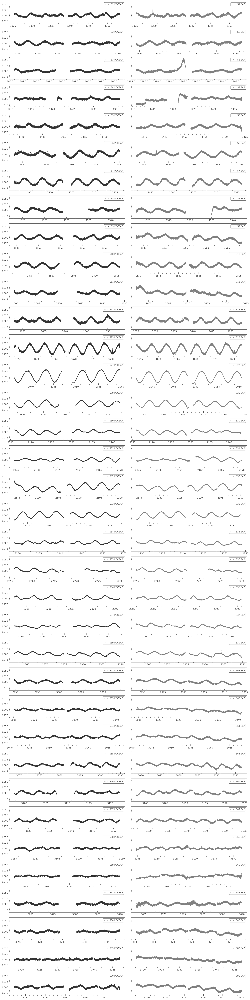

In [4]:
flux_col = "pdcsap_flux"
with plt.style.context(lk.MPLSTYLE):
    _lcc = lcc_tess[:]
    fig, axs = plt.subplots(len(_lcc), 2, sharey=1, figsize=(18, 2 * len(_lcc)))
    for i, lc in enumerate(_lcc):
        ax = axs[i][0]
        lc.select_flux("pdcsap_flux").remove_outliers(sigma=99).normalize().scatter(ax=ax, label=f"S{lc.sector} PDCSAP")
        ax.set_xlabel(None); ax.set_ylabel(None);

        ax = axs[i][1]
        lc.select_flux("sap_flux").remove_outliers(sigma=99).normalize().scatter(ax=ax, c="gray", label=f"S{lc.sector} SAP")
        ax.set_xlabel(None); ax.set_ylabel(None);

    plt.tight_layout();

### Contamination ruled out

A nearby, fainter TIC 271891175  / Gaia DR3 5262924011077368576 is listed as a RS variable in Gaia DR3, but it is not the source of the observed variability



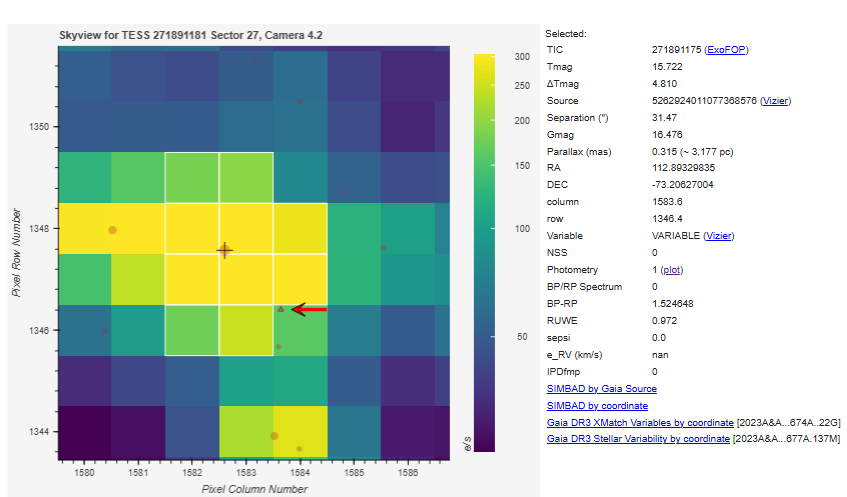

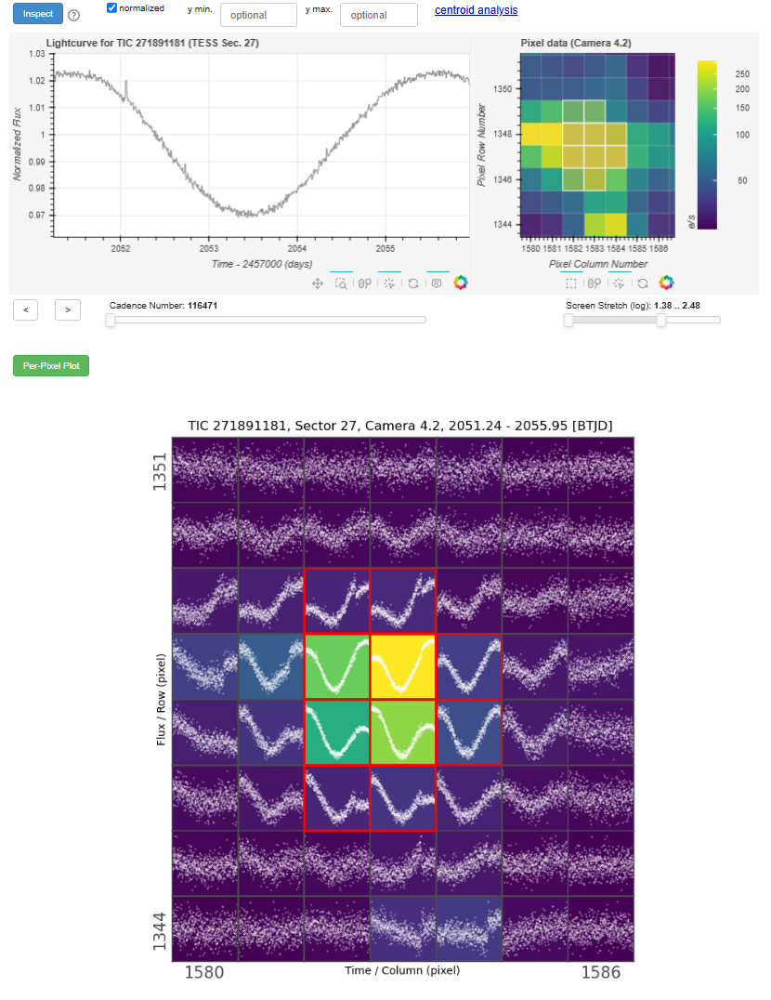


See also Gaia DR3 photometry of the nearby star: https://gaia.ari.uni-heidelberg.de/singlesource.html#gaiadr3_id=5262924011077368576



## Gaia DR3 info (coordinate, etc.)

In [5]:
# reload(lke)
# reload (lket)
rs_all_cols, rs, rs_html  = lket.search_gaiadr3_of_tics(tic, radius_arcsec=15, magnitude_range=None,  pm_error_factor=None, pm_range_fraction=None, pm_range_minimum=1.0, 
                                                        calc_separation_from_first_row=True,  # assuming the first row is the target, it'd calculate more accurately the separation for Gaia DR3 Main
                                                        compact_columns=True, also_return_html=True, also_return_astrophysical=False, verbose_html=True, include_nss_summary_in_html=False)
display(HTML(rs_html))

# from Gaia DR3
target_coord = SkyCoord(rs[0]["RAJ2000"], rs[0]["DEJ2000"], unit=(u.deg, u.deg), frame="icrs")
target_coord_dict = dict(ra=target_coord.ra.value, dec=target_coord.dec.value)


In [6]:
primary_name = "TIC 271891181"


## Combining all data

- TESS only, just convert time to HJD and flux to mag for VSX
- ASAS-SN SkyPatrol data does not seem to have the precision to show the variability: https://asas-sn.osu.edu/sky-patrol/coordinate/f33ca58c-b47c-4108-9f8e-a9d89e75d7da


TESS # data points: 378917


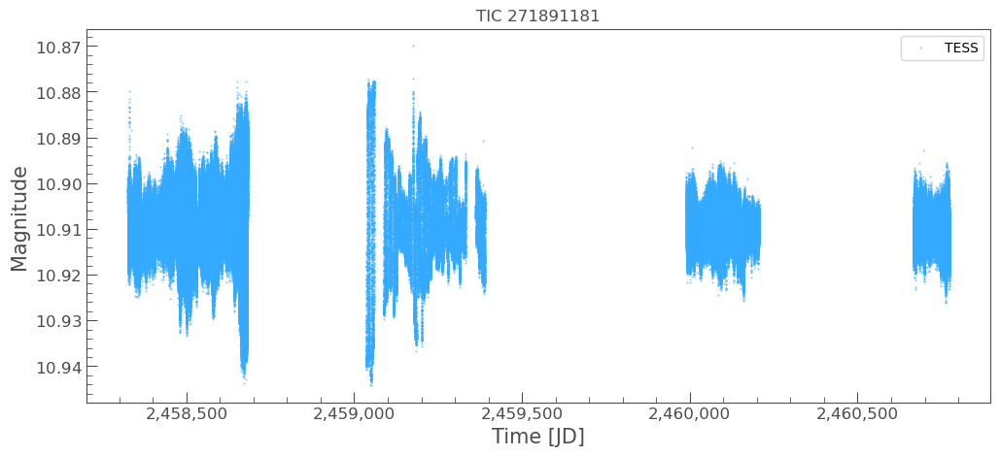

In [7]:
# Convert the data to magnitude and HJD/UTC

import lightkurve_ext_multi_sources as lkem
# reload(lkem)

lc_tess = lke.stitch(lcc_tess, ignore_incompatible_column_warning=True, )
lc_tess = lc_tess.remove_nans()
lc_tess = lc_tess.remove_nans(column="flux_err")
lc_tess_norm = lc_tess  # keep normalized one for LS Periodogram

lc_tess = lke.convert_lc_time_to_hjd_utc(lc_tess, target_coord=target_coord, cache_dir=lk_download_dir)
lc_tess = lke.to_flux_in_mag_by_normalization(
    lc_tess, 
    base_mag=10.91,  # target from ExoFOP
)  
# axs = tplt.plot_skip_data_gap(lc_tess, figsize=(30,5), s=4, alpha=0.9);

lc_combined_dict = lkem.combine_multi_bands_and_shift(
    {"TESS": lc_tess, 
    }, 
)

for k in lc_combined_dict.keys():
    print(f"{k} # data points:", len(lc_combined_dict[k]))

plot_options = lkem.get_default_plot_multi_bands_options_copy()
# for TESS plot (index 0) move it to the front
plot_options[0][1]["zorder"] = 3  # default 2

ax = lkem.plot_multi_bands(lc_combined_dict, figsize=(12, 5), target_name=primary_name, plot_options=plot_options);
# ax.set_ylim(15.2, 14.0);

In [8]:
print("Median flux error by band")

for k, lc in lc_combined_dict.items():
    print(f"  {k}: ", np.nanmedian(lc.flux_err))

Median flux error by band
  TESS:  0.0017705579521134496 mag


## Initial Period, epoch

2459036.2890984584


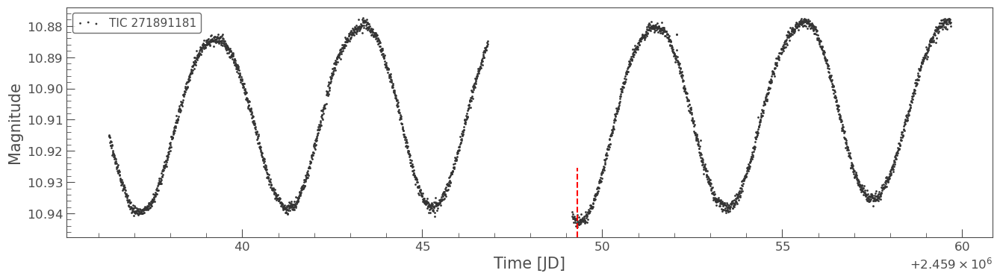

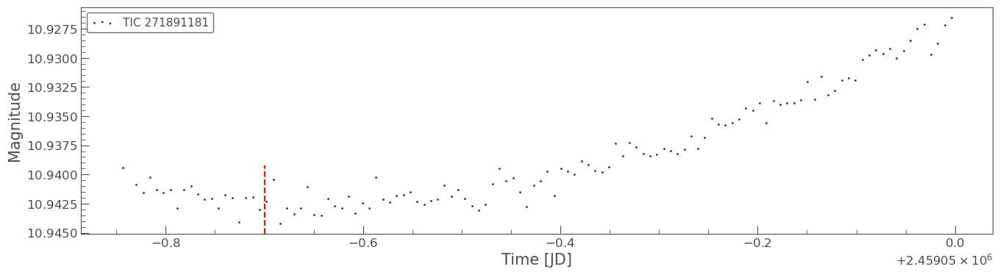

In [9]:
# epoch: global minimum around sector 27

epoch_time_hjd_initial = 2459049.3

print(lke.of_sector(lcc_tess, 27).time.min().to_value("jd"))
ax = tplt.scatter(lc_tess.truncate(2459036, 2459036 + 30), figsize=(16, 4));
ax.axvline(epoch_time_hjd_initial, ymax=0.3, c="red", linestyle="--");


ax = tplt.scatter(lc_tess.truncate(2459049, 2459050), figsize=(16, 4));
ax.axvline(epoch_time_hjd_initial, ymax=0.3, c="red", linestyle="--");


In [28]:
pg = (
    lc_tess_norm
    .to_periodogram(method="lombscargle",
                    # tried to change the grid with oversample_factor, no significant change in the peaks, so leave it alone
                    # minimum_period=0.5, oversample_factor=500,  # default: 5
                    # ls_method="fastchi2", nterms=2,
                      )
     )
print(len(lc), lc.time.max() - lc.time.min(), lc.time.min(), lc.time.max(), )
pg.show_properties();

print("period_at_max_power:", pg.period_at_max_power, "/", pg.frequency_at_max_power.to(u.microhertz))


20257 28.80602785859901 3718.1386913410074 3746.9447191996064
lightkurve.Periodogram properties:
      Attribute                   Description            Units
---------------------- --------------------------------- -----
                nterms                                 1      
              targetid                         271891181      
          default_view                         frequency      
                 label                     TIC 271891181      
             ls_method                              fast      
frequency_at_max_power                            0.2496 1 / d
             max_power                            0.0055      
               nyquist                          359.9948 1 / d
   period_at_max_power                            4.0067     d
             frequency                  array (4358904,) 1 / d
                period                  array (4358904,)     d
                 power                  array (4358904,)      
                  met

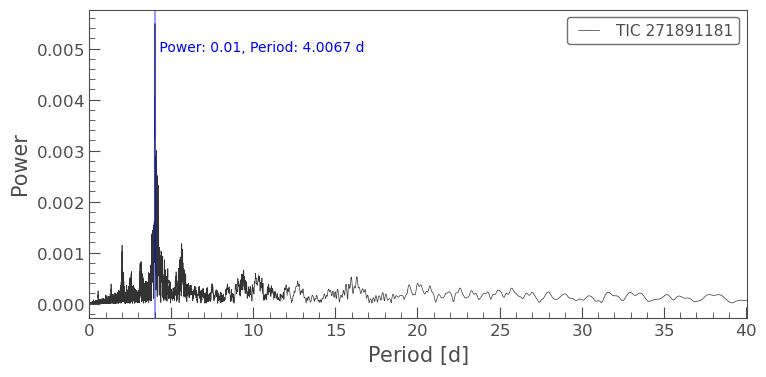

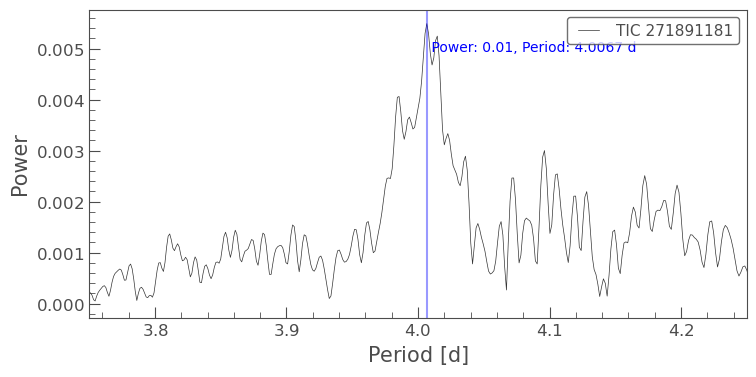

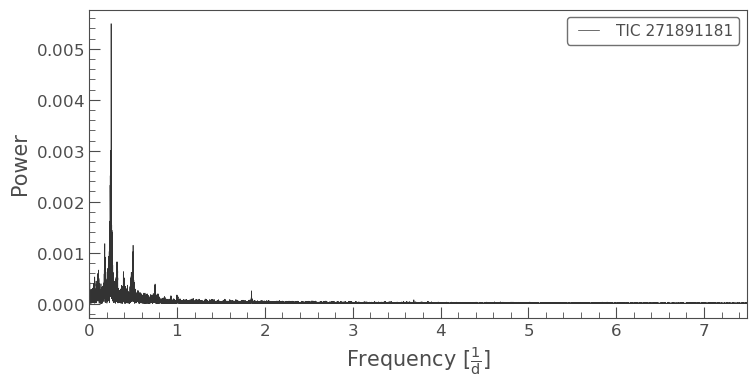

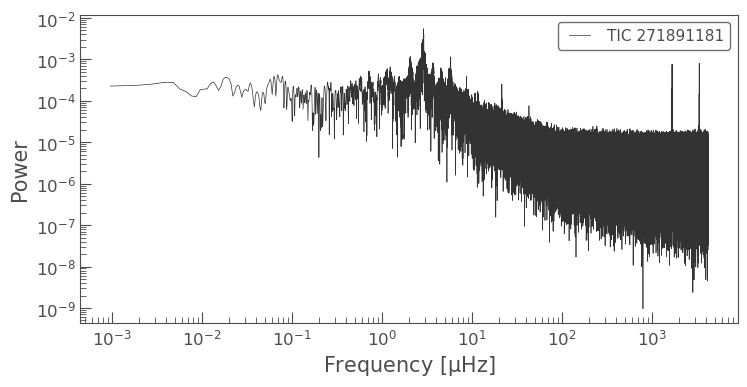

In [31]:
ax = lke_pg.plot_pg_n_mark_max(pg, max_period_factor=10);

# zoom in
ax = lke_pg.plot_pg_n_mark_max(pg);
ax.set_xlim(3.75, 4.25);

# ---
ax = pg.plot(view="frequency");  # frequency view
ax.set_xlim(0 , pg.frequency_at_max_power.value * 30);


# frequency in log scale / microhertz
# often useful for solar type oscillator, 
ax = pg.plot(view="frequency", unit=u.microhertz, scale="log");  
# the smoothed plot is useful for repsresenting convective background (that scientists usually want to filter out)
# smooth_pg = pg.smo7oth(method='logmedian', filter_width=0.1)
# smooth_pg.plot(ax=ax, linewidth=2,  color='red', label='Smoothed (bkg)', unit=u.microhertz, scale='log');
# ax.axvline(50.31207607657116, ymax=0.2, color="blue", linestyle="--", label="~50 uHz "); ax.legend();


In [32]:
# reload(lke_pg)
peaks = lke_pg.find_peaks(
    pg,
    # pg[pg.frequency < 500 * u.microhertz], 
    # powerlimit=0.0001,   
)
if "period" not in peaks.columns:
    peaks["period"] = 1 / peaks["frequency"]
    peaks["period"].unit = 1 / peaks["frequency"].unit
if "frequency" not in peaks.columns:
    peaks["frequency"] = 1 / peaks["period"]
    peaks["frequency"].unit = 1 / peaks["period"].unit
peaks["frequency_u"] = u.Quantity(peaks["frequency"]).to(u.microhertz)  # in microhertz, for log scale plot
peaks["period_h"] = u.Quantity(peaks["period"]).to(u.hour)  # period in hours
peaks["rank"] = np.linspace(1, len(peaks), len(peaks), dtype=int)

# peaks[peaks["frequency"] < 1][:10]  # in 1/d
peaks[:10]

power,frequency,prominence,lower_hwhm,upper_hwhm,fwhm,frequency_ratio,period,frequency_u,period_h,rank
,1 / d,,1 / d,1 / d,1 / d,,d,uHz,h,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32
0.0054914697381059936,0.24958203279265578,0.005487181355521867,-0.0012226,+0.0016329,0.0028555,1.000,4.0066986746228075,2.888680935100183,96.16076819094738,1
0.0030016807024803565,0.24413120083887838,0.0027354731827661355,-0.00021184,+0.00023379,0.00044563,1.022,4.096158117290299,2.825592602301833,98.30779481496718,2
0.002509816261960728,0.23967142924033324,0.0023708530682367995,-0.0016416,+0.00068788,0.0023295,1.041,4.172378840354971,2.77397487546682,100.1370921685193,3
0.0024630848794476115,0.24553520300879075,0.0016861204059148796,-0.00013406,+0.00020487,0.00033893,1.016,4.072735753350193,2.84184262741656,97.74565808040462,4
0.0015418188894059175,0.25610651346460145,0.0014427615103069764,-0.0002566,+0.0002331,0.0004897,0.975,3.90462540945183,2.9641957576921465,93.71100982684392,5
0.0021963926466407047,0.24223166849134992,0.0013919547124687777,-0.00015114,+0.0001813,0.00033245,1.030,4.128279370852412,2.8036072742054388,99.0787049004579,6
0.002543788907107589,0.24355308229832623,0.0011682608098365803,-0.00014482,+0.00018956,0.00033438,1.025,4.105881110447652,2.818901415489887,98.54114665074366,7
0.0011770029600944633,0.17739980358657334,0.0011673135278876248,-0.00020792,+0.00068014,0.00088806,1.407,5.636984820628549,2.0532384674371915,135.28763569508519,8


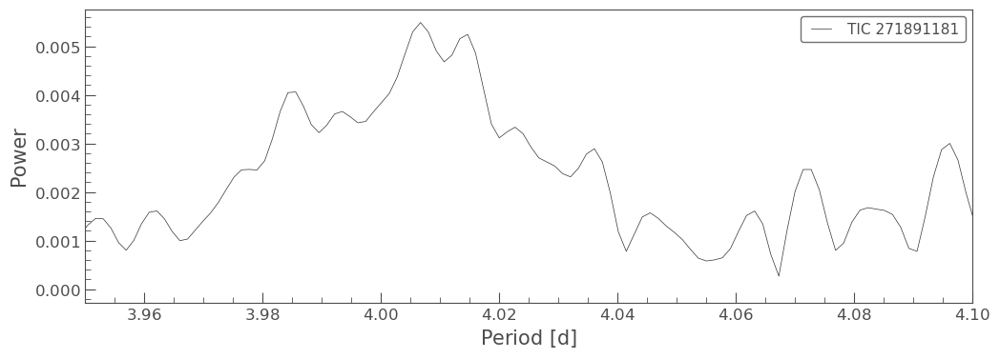

In [78]:
# a peak around 4.01 - 4.02 is not among the top ones
%matplotlib inline

ax = tplt.lk_ax(figsize=(12, 4))
ax = pg.plot(view="period", ax=ax);
ax.set_xlim(3.95, 4.10);


In [61]:
# find the mini peaks missed by find_peaks

# pgt = pg.to_table()
# display(pgt[(pgt["period"] > 4.01 * u.d) & (pgt["period"] < 4.025 * u.d)])

peaks[(peaks["period"] > 4.01) & (peaks["period"] < 4.025)]

power,frequency,prominence,lower_hwhm,upper_hwhm,fwhm,frequency_ratio,period,frequency_u,period_h,rank
,1 / d,,1 / d,1 / d,1 / d,,d,uHz,h,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32
0.005246044251673063,0.24908650261503965,0.0005666714358364671,-6.035e-05,+0.00013007,0.00019042,1.002,4.0146695605802805,2.8829456321185143,96.35206945392673,51
0.003333841907597805,0.24859097243742354,0.00022061282540970263,-6.9248e-05,+9.2689e-05,0.00016194,1.004,4.022672224156187,2.8772103291368465,96.54413337974849,220


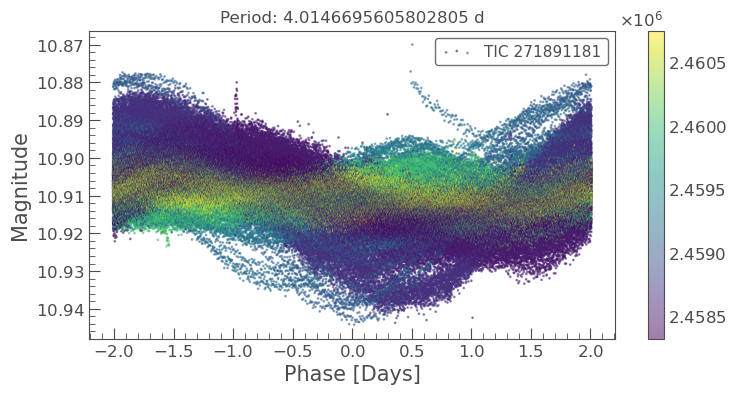

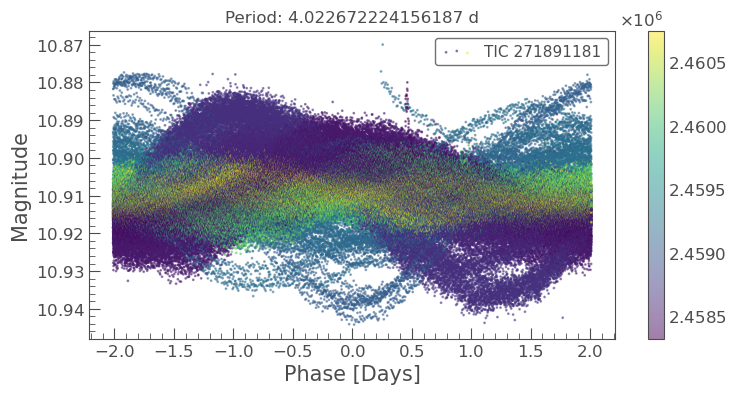

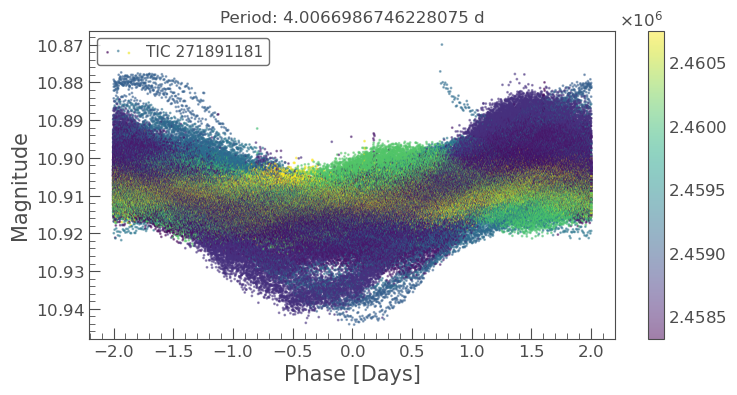

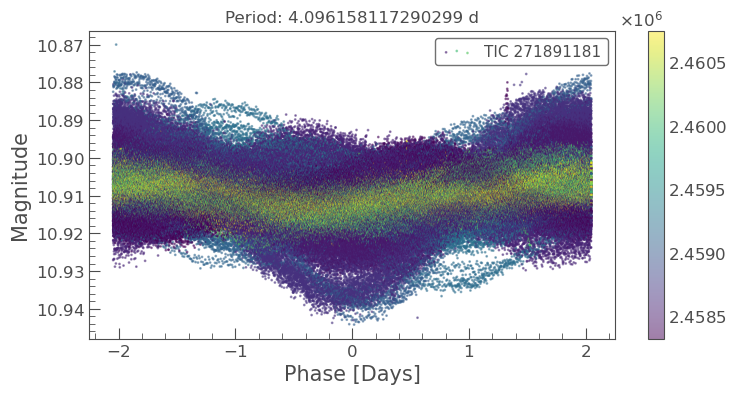

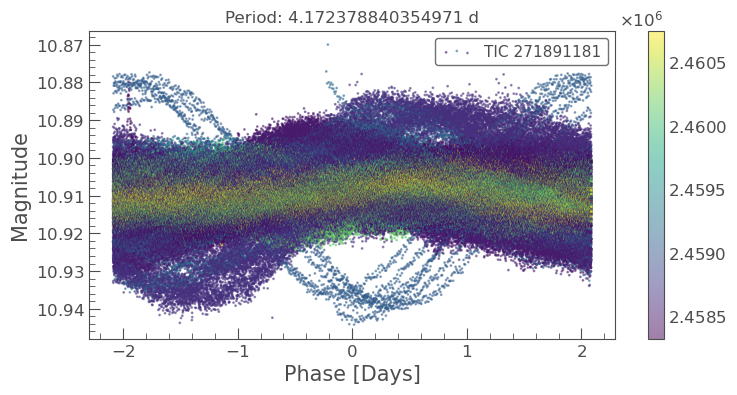

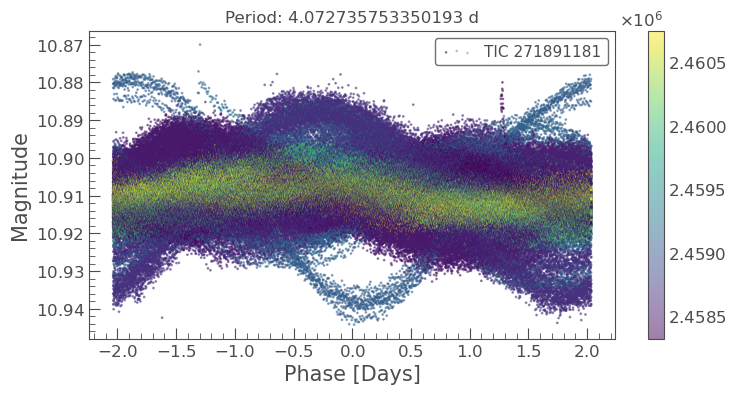

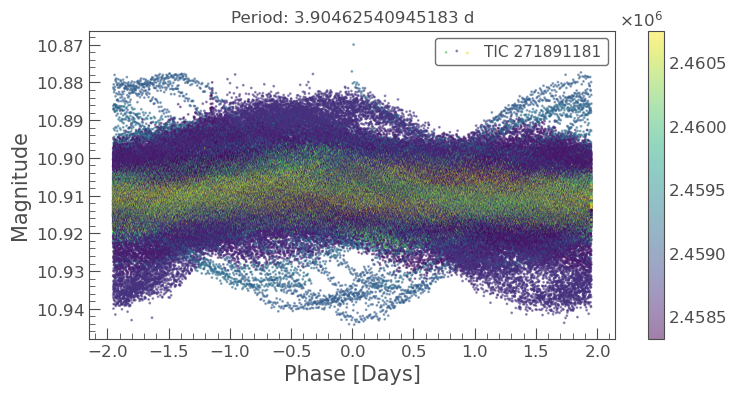

In [60]:
# check the top peaks , plus the potential ones identified visually
for per in np.concatenate(([4.0146695605802805, 4.022672224156187], peaks["period"][:5].value)) * u.d:
    lc_f = lc_tess.fold(period=per, epoch_time=epoch_time_hjd_initial);
    ax = tplt.scatter(lc_f, c=lc_f.time_original.value, alpha=0.5);
    ax.set_title(f"Period: {per}");

In [69]:
peaks[:2]

power,frequency,prominence,lower_hwhm,upper_hwhm,fwhm,frequency_ratio,period,frequency_u,period_h,rank
,1 / d,,1 / d,1 / d,1 / d,,d,uHz,h,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32
0.0054914697381059936,0.24958203279265578,0.005487181355521867,-0.0012226,+0.0016329,0.0028555,1.000,4.0066986746228075,2.888680935100183,96.16076819094738,1
0.0030016807024803565,0.24413120083887838,0.0027354731827661355,-0.00021184,+0.00023379,0.00044563,1.022,4.096158117290299,2.825592602301833,98.30779481496718,2


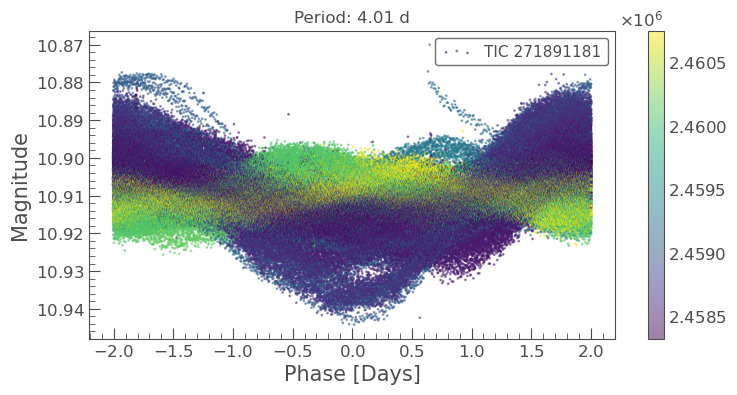

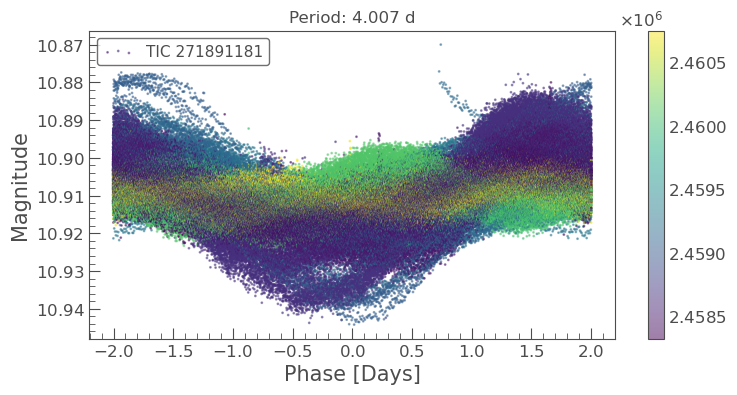

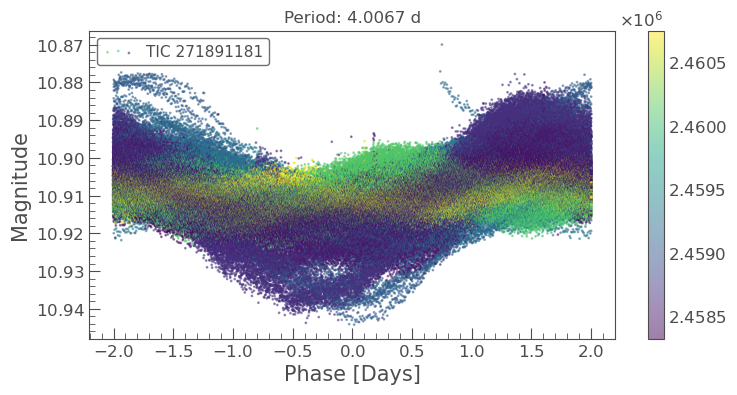

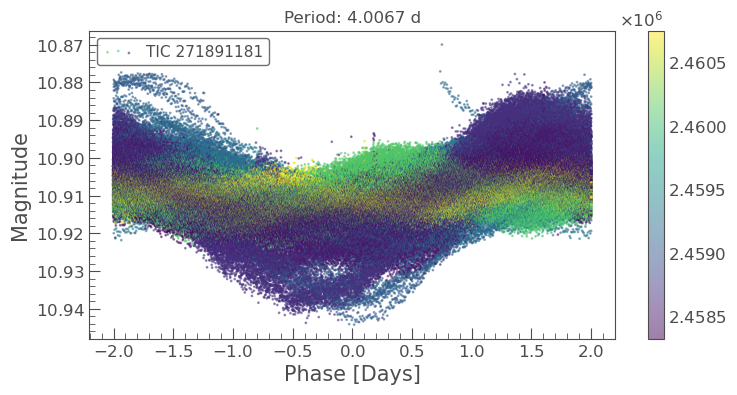

In [68]:
# Consider between 4.0066986746228075 and 4.096158117290299
# use the global peak 4.0066986746228075 from LS

# check the precision to be used
for n in range(2, 6):
    per = np.round(4.0066986746228075 * u.d, n)
    lc_f = lc_tess.fold(period=per, epoch_time=epoch_time_hjd_initial);
    ax = tplt.scatter(lc_f, c=lc_f.time_original.value, alpha=0.5);
    ax.set_title(f"Period: {per}");


In [77]:
lc_tess.to_fits(path="tmp/tic_271891181_s1-89.fits", overwrite=True);  # export the data to be use in VStar

ANOVA result from VStrar is comparable to LS Periodgram done here

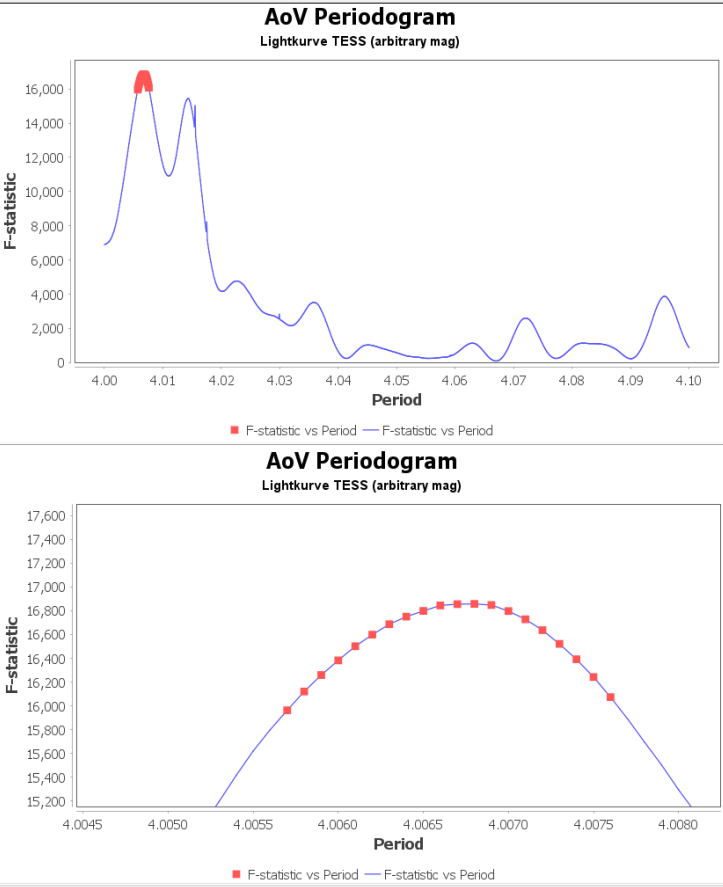


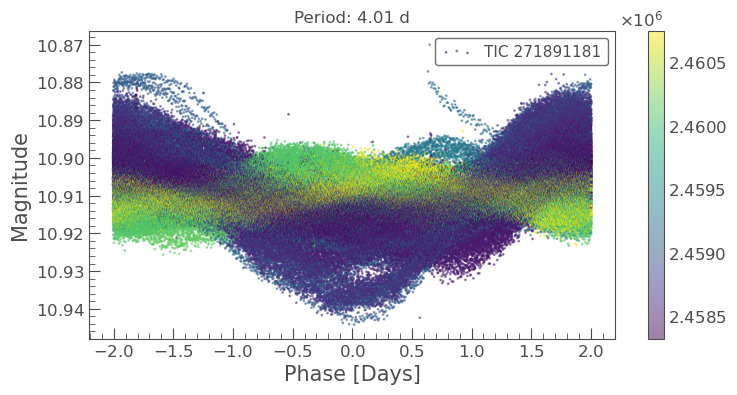

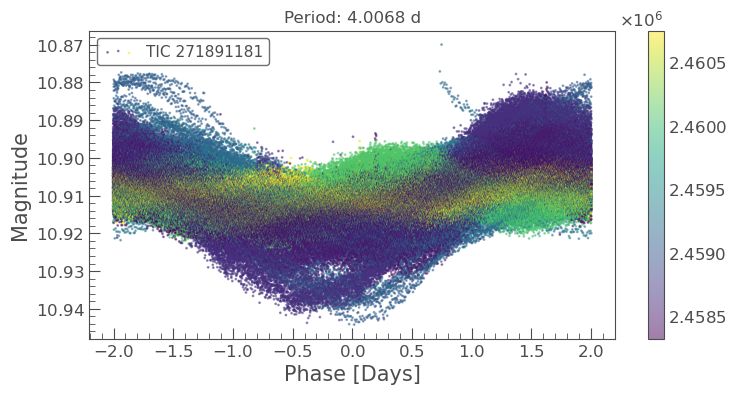

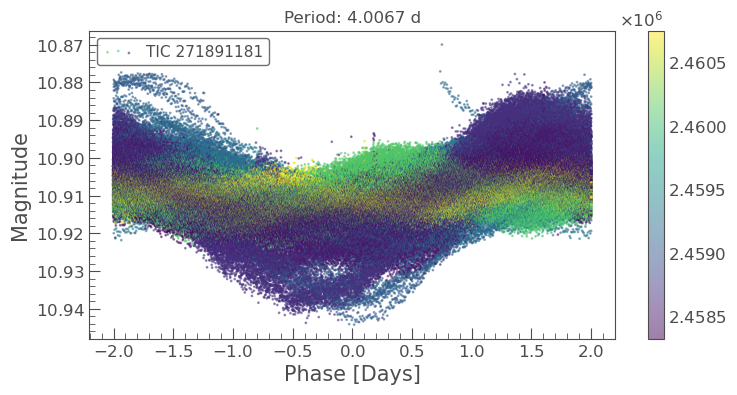

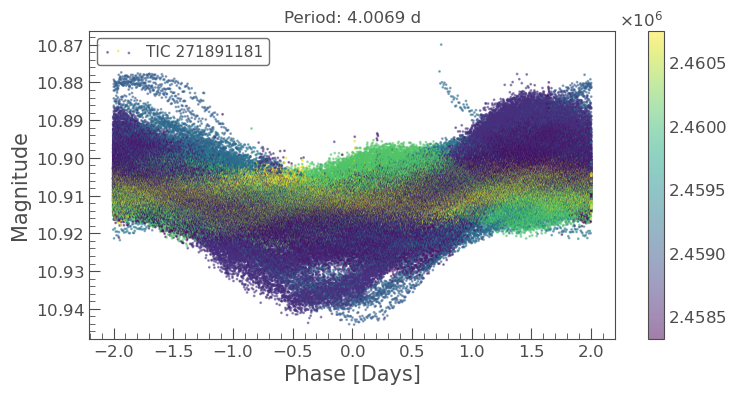

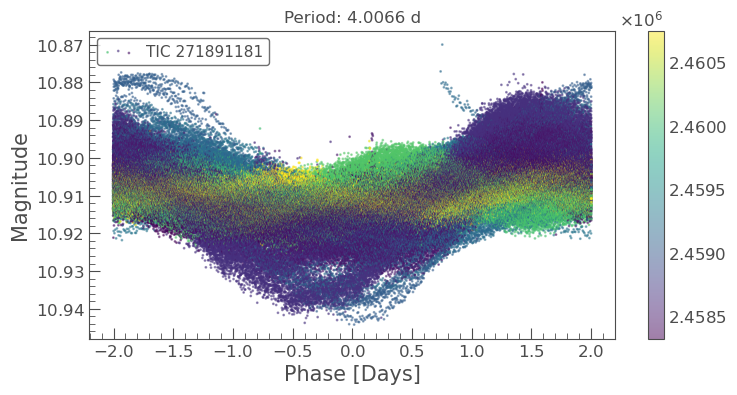

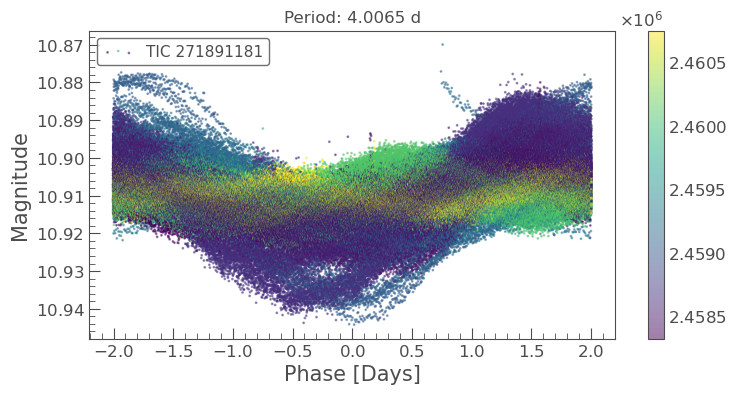

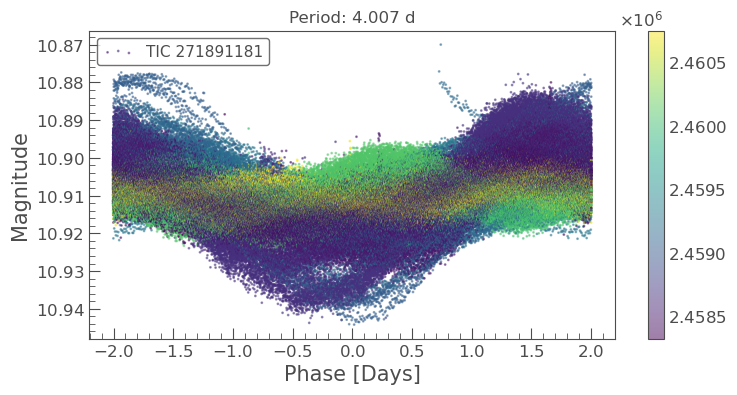

In [129]:
# check the AoV peaks , along with the rounded LS result for comparison
for per in np.array([
    4.01,  # the rounded result from LS to be adopted 
    4.0068, 4.0067, 4.0069, 4.0066, 4.0065, 4.007,  # top AoV results
]) * u.d:
    lc_f = lc_tess.fold(period=per, epoch_time=epoch_time_hjd_initial);
    ax = tplt.scatter(lc_f, c=lc_f.time_original.value, alpha=0.5);
    ax.set_title(f"Period: {per}");

### See if rotational period changes over time

- Possible apparent variation over time by analyzing the best period on a yearly basis

Period: 4.002927107623707 d
Period: 3.998004570134549 d
Period: 4.0869439622686015 d
Period: 4.112946530613972 d


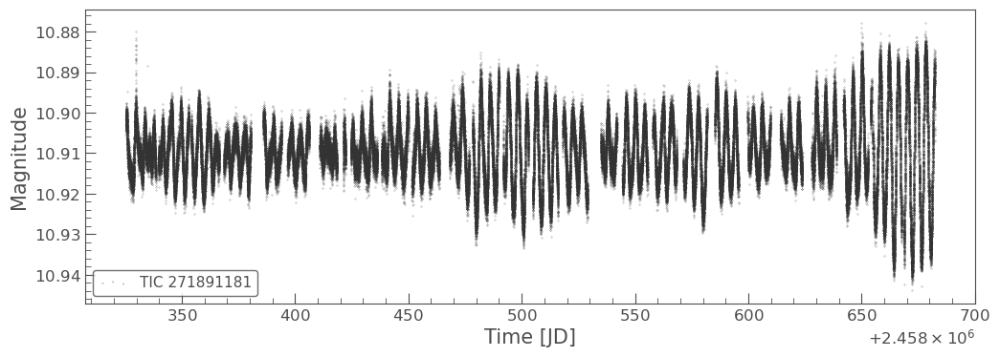

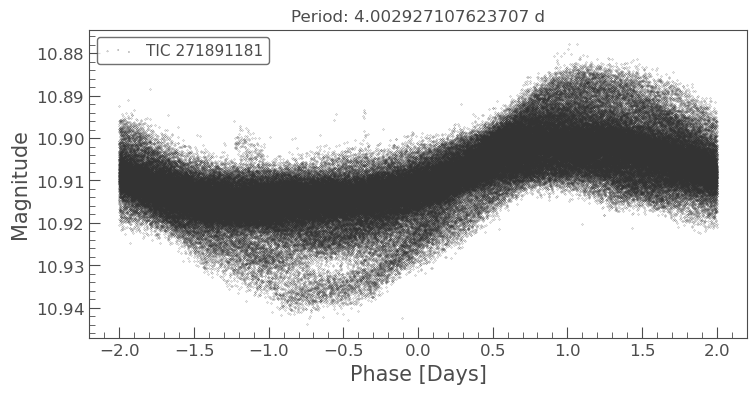

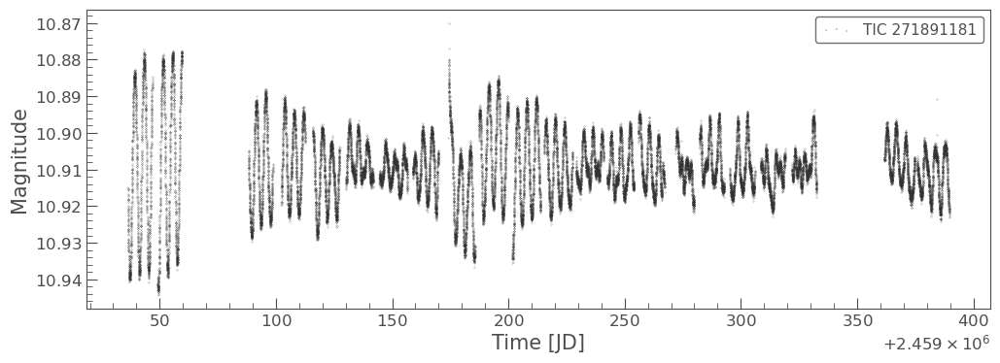

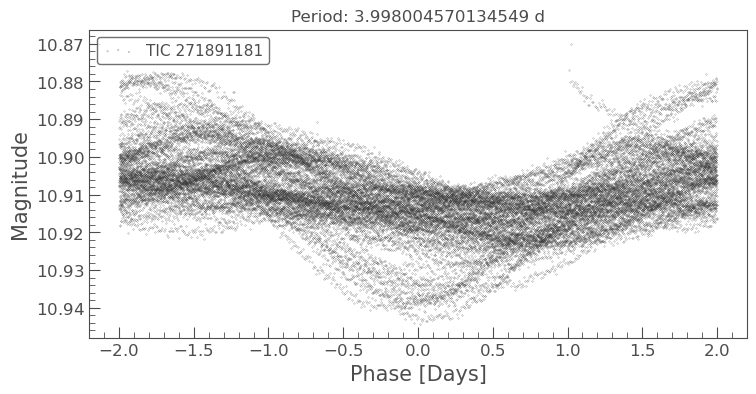

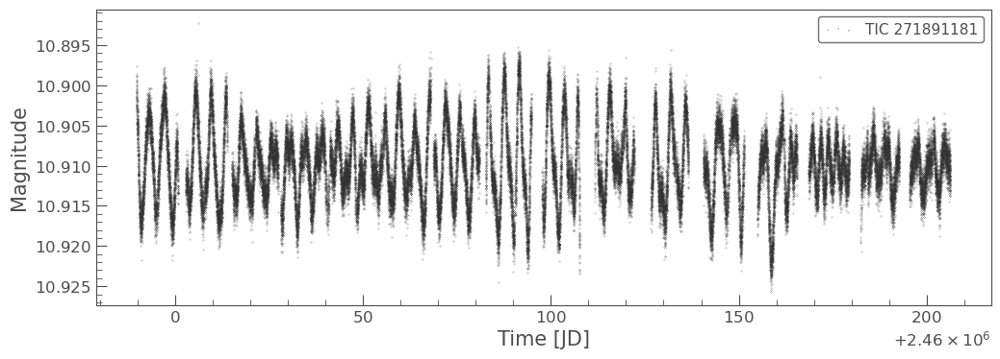

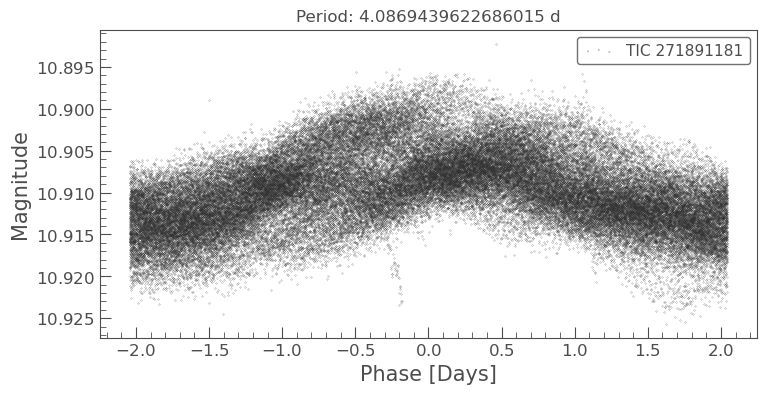

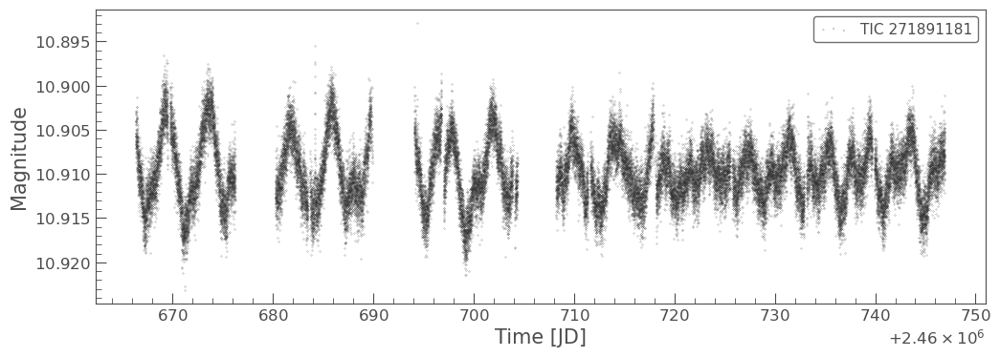

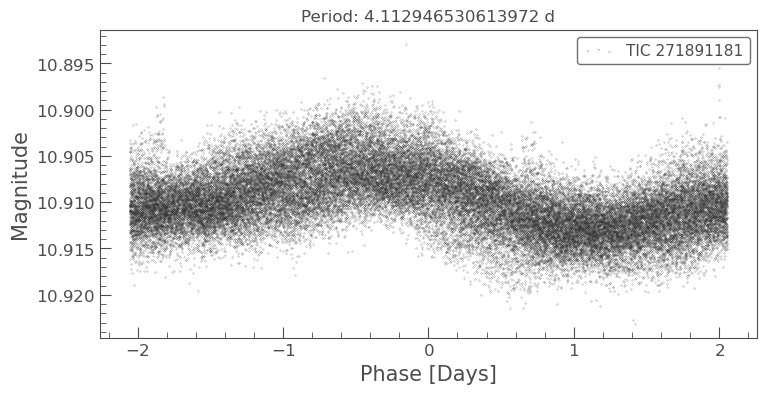

In [144]:
# tstart = lc_tess.time.min().value
# ax = lkem.plot_multi_bands(lc_combined_dict, figsize=(24, 10), target_name=primary_name, plot_options=plot_options);
# for i in range(1, 8):
#     ax.axvline(tstart + 365 * i, ymax=0.2, c="red", ls="--");

for tstart, tstop in [
    (2458325, 2458700),  # sectors 1 - 13
    (2459000, 2459450),  # sectors 27 - 39
    (2459950, 2460300),  # sectors 62 - 69
    (2460650, 2461000),  # sectors 87 - 89 (more data in sectors 9x)
]:
    lc = lc_tess.truncate(tstart, tstop);
    ax = tplt.scatter(lc, s=0.1, figsize=(12, 4));
    _pg = lc.to_periodogram(method="lombscargle");
    lc_b = lc.fold(period=_pg.period_at_max_power, epoch_time=epoch_time_hjd_initial);
    ax = tplt.scatter(lc_b, s=0.1);
    print(f"Period: {_pg.period_at_max_power}");
    ax.set_title(f"Period: {_pg.period_at_max_power}");
    

### See if the calaucated rotational period is biased towards early data

- The LS Periodogram global peak is around 4.007 d.
- The abvoe (change over time) analysis shows the period of the early sectors is closer to the global peak:
```
S01 - 13:  4.003d  (2 min cadence)
S27 - 39:  3.998d  (10 min cadence)
S62 - 69:  4.087d  (200s cadence)
S87 - 89:  4.113d  (2 min cadence)
```

- Investigate if the LS Periodogram peak is biased towards early data because of the voulume of the data (more sectors and higher cadence)
- Result: no change

lightkurve.Periodogram properties:
      Attribute                   Description            Units
---------------------- --------------------------------- -----
                nterms                                 1      
              targetid                         271891181      
          default_view                         frequency      
                 label                     TIC 271891181      
             ls_method                              fast      
frequency_at_max_power                            0.2496 1 / d
             max_power                            0.0054      
               nyquist                              72.0 1 / d
   period_at_max_power                            4.0067     d
             frequency                   array (871792,) 1 / d
                period                   array (871792,)     d
                 power                   array (871792,)      
                  meta <class 'collections.OrderedDict'>      
Period: 4.0066939664

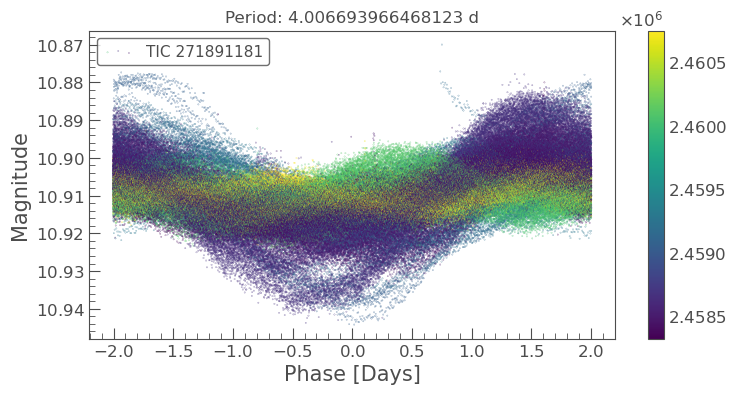

In [166]:
# make early darta has about the same number of sector as the later data
lc_tess_subset = lke.of_sectors(lcc_tess, 
               1,2, 6, 12, 13,
               27,29, 32, 37, 39,
               62,63,64,65,66,67,68,69,
               87,88,89,
              ).stitch()

# then binned to 10 min (lowerest denominator), so that the num. of data points of early sectors would be about the same as those of the later sectors.
lc_tess_subset_binned = lke.bin_flux(lc_tess_subset, time_bin_size=10*u.min)


_pg = lc_tess_subset_binned.to_periodogram(method="lombscargle")
_pg.show_properties()

lc_b = lc_tess.fold(period=_pg.period_at_max_power, epoch_time=epoch_time_hjd_initial);
ax = tplt.scatter(lc_b, s=0.1, c=lc_b.time_original.value);
print(f"Period: {_pg.period_at_max_power}");
ax.set_title(f"Period: {_pg.period_at_max_power}");


## Final Period, epoch

In [10]:
period_final = 4.01  # visually the precision is only 2 digits, consistent with the FWHM of 0.003
epoch_time_hjd_final = 2459049.35  # fine tune after inspecting larger phase plot

print(period_final, epoch_time_hjd_final)

4.01 2459049.35


## Flares


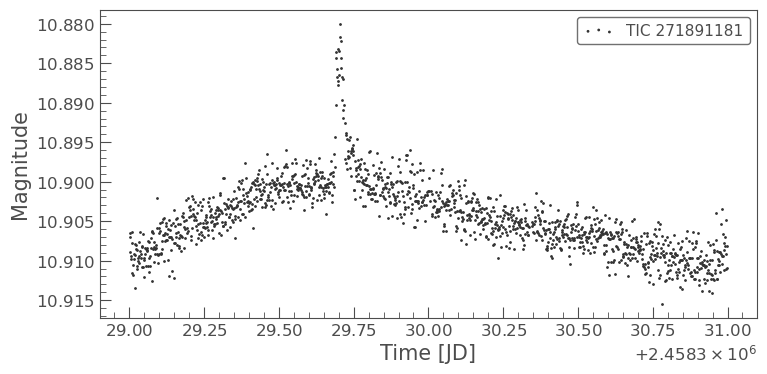

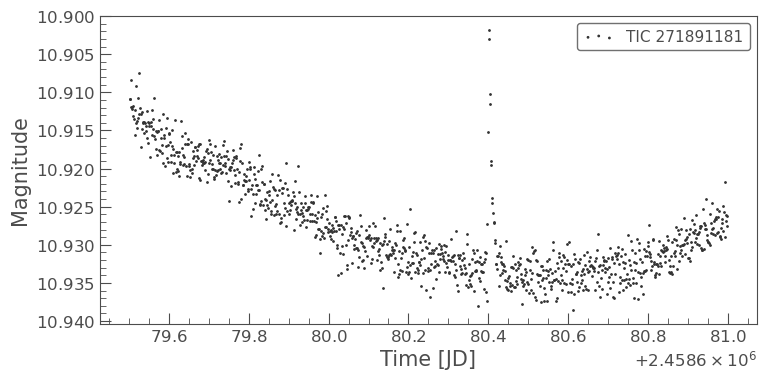

In [11]:
# Flares observed in 1, 6, 12, 13, 39, 62, 87 ; the largest one is probably 13 or 1

# print(lke.of_sector(lcc_tess, 1).time.min().to_value("jd"));

tplt.scatter(lc_tess.truncate(2458329, 2458331));  #  2458325, 2458325 + 30 -- roughly sector 1
tplt.scatter(lc_tess.truncate(2458679.5, 2458681));  # 2458653, 2458653 + 30  -- roughly sector 13

## Plots for VSX

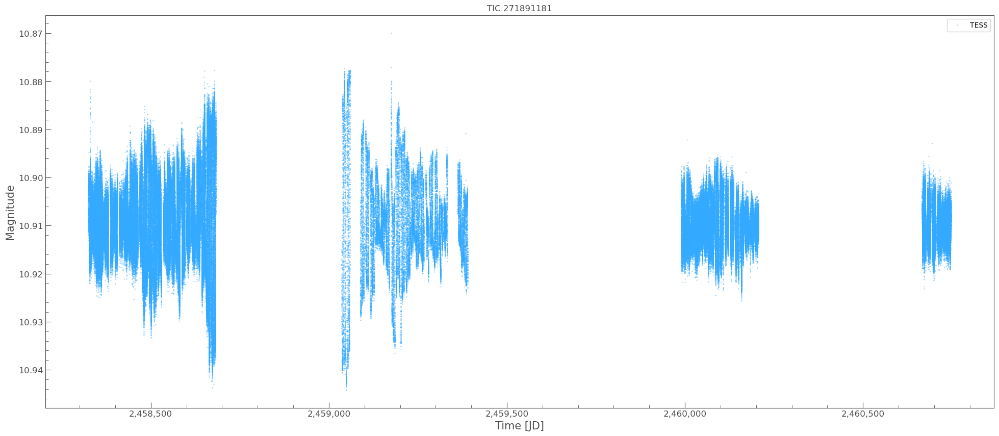

In [132]:
# reload(lkem)
# Not needed
plot_options = lkem.get_default_plot_multi_bands_options_copy()
plot_options[0][1]["zorder"] = 4

ax = lkem.plot_multi_bands(lc_combined_dict, figsize=(24, 10), target_name=primary_name, plot_options=plot_options);
# ax.set_title(ax.get_title() + "");

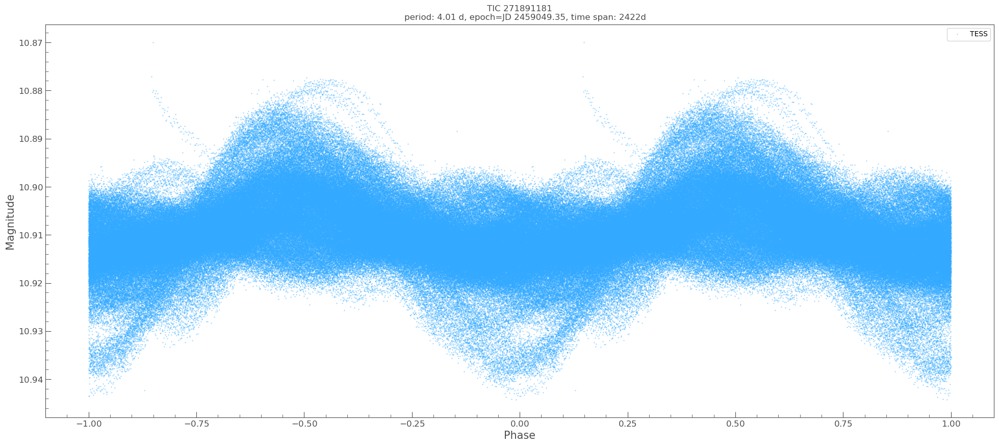

In [133]:
# reload(lkem)

plot_options = lkem.get_default_plot_multi_bands_options_copy()
# plot_options[0][1]["zorder"] = 3  # default 2
# plot_options[0][1]["s"] = 4
# plot_options[1][1]["markersize"] = 9

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,
    period=period_final,
    epoch=Time(epoch_time_hjd_final, format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(24, 10),
    target_name=primary_name,
    plot_options=plot_options,
);
ylim = (None, None)
# ylim = (18.6, 15.0)
ax.set_ylim(*ylim);
# ax.set_title(ax.get_title() + "\nOutliers truncated.");


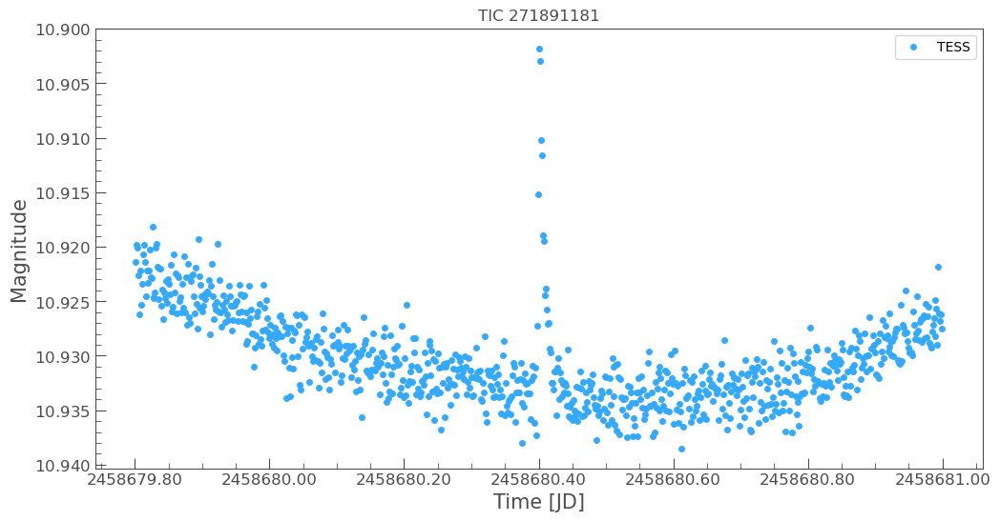

In [134]:
from matplotlib.ticker import FuncFormatter

plot_options = lkem.get_default_plot_multi_bands_options_copy()
plot_options[0][1]["s"] = 16

ax = lkem.plot_multi_bands({"TESS": lc_tess.truncate(2458679.8, 2458681) }, figsize=(12, 6), target_name=primary_name, plot_options=plot_options);
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, p: f"{x:.2f}"))  # format(float(x), ",")  # thousands separator

## VSX Report Table

In [13]:
def report_to_df(report):
    df = pd.DataFrame()
    df["Field"] = report.keys()
    df["Value"] = report.values()
    return df

In [17]:
import bibs_utils
# reload(bibs_utils)

other_names = f"TIC {tic},2MASS J07312999-7311580,TYC 9191-12-1"  # from ExoFOP, verified with SIMBAD
other_names += ",[ZYL2019] AST3II J112.8751-73.1993"  # ID from the initial variable identification paper 2019ApJS..240...16Z, too long to be used as VSX primary name (DB error with data too long for column o_designation)
other_names += ",UCAC4 085-013660"  # https://vizier.cds.unistra.fr/viz-bin/VizieR-5?-ref=VIZ67fdca0c235d04&-out.add=.&-source=I/322A/out&UCAC4===085-013660    
other_names += ",GSC 09191-00012"  # https://vizier.cds.unistra.fr/viz-bin/VizieR-5?-ref=VIZ67fdcac424f254&-out.add=.&-source=I/255/out&GSC=0919100012


remarks = f"""Small flares with amplitudes up to 0.03 TESS. Listed as an astrometric binary in 2022yCat.1357....0G ."""  

revision_comment = "Type, period, epoch and amplitude from TESS data. Mean magnitude derived from Gaia DR3. Position and spectral type from Gaia DR3."


BIBS = bibs_utils.BIBS
vsx_report = dict(
    Position=f"{target_coord.ra.value}, {target_coord.dec.value}",
    Primary_Name=primary_name,  
    Other_Names=other_names,
    Variable_Type="ROT+UV",
    Spectral_Type="G",  # from Gaia DR3 astrophysical parameters
    Spectral_Type_Uncertain=False,
    Maximum_Magnitude=11.55,   # derived from Gaia DR3 G
    Maximum_Magnitude_band="V",
    Minimum_Magnitude=10.94 - 10.88,  # report amplitude, max / min from eyeballing phase plot
    Minimum_Magnitude_band="TESS",  
    Minimum_Is_Amplitude=True,
    Period=period_final,  # precision already baked in
    Epoch=epoch_time_hjd_final,  # precision already baked in
    Discoverer="H. Zhang et al.",  # note: discoverer format is first name - last name, different from reference
    Remarks=remarks,
    Revision_Comment=revision_comment,
    Reference0_Name=BIBS.TESS_N,
    Reference0_Bib=BIBS.TESS_B,
    Reference1_Name=BIBS.TESS_SPOC_N,
    Reference1_Bib=BIBS.TESS_SPOC_B,
    Reference2_Name="Zhang, H.; et al., 2019, Exoplanets in the Antarctic Sky. I. The First Data Release of AST3-II (CHESPA) and New Found Variables within the Southern CVZ of TESS",
    Reference2_Bib="2019ApJS..240...16Z",  # initial variable discovery (incorrect type)
    Reference3_Name="Tu, Z.; et al., 2020, Superflares on Solar-type Stars from the First Year Observation of TESS",
    Reference3_Bib="2020ApJ...890...46T",  # published result for flare (UV type)
    Reference4_Name=BIBS.GAIA_DR3_N,  
    Reference4_Bib=BIBS.GAIA_DR3_B,  # for mean magnitude, Gaia DR3 G 
    Reference5_Name=BIBS.GAIA_DR3_ASTROPHY_N,
    Reference5_Bib=BIBS.GAIA_DR3_ASTROPHY_B,  # spectral type
)

def print_long_fields(report):
    other_names_list = report["Other_Names"].split(",")
    print("Other Names (1 line each):")
    print("\n".join(other_names_list))
    print("")
    print(report["Remarks"])
    print("")
    print(report["Revision_Comment"])

print_long_fields(vsx_report)
with pd.option_context('display.max_colwidth', None):
    display(report_to_df(vsx_report))


# Combined LC probably not needed for EA with no long term variation
# tic61768908_combined_plot.png : Combined light curve - Combined light curve from from TESS and corrected ASAS-SN; shifted to corrected ASAS-SN V.
print("""
tic271891181_combined_plot.png : Light curve - Light curve with TESS data.
tic271891181_phase_plot_rot.png : Rotation Phase Plot - Phase Plot for rotational variability.
tic271891181_zoom_plot_flare.png : Light Curve (flare) - Light Curve with TESS data, zoomed at a flare.
""")


Other Names (1 line each):
TIC 271891181
2MASS J07312999-7311580
TYC 9191-12-1
[ZYL2019] AST3II J112.8751-73.1993
UCAC4 085-013660
GSC 09191-00012

Small flares with amplitudes up to 0.03 TESS. Listed as an astrometric binary in 2022yCat.1357....0G .

Type, period, epoch and amplitude from TESS data. Mean magnitude derived from Gaia DR3. Position and spectral type from Gaia DR3.


,Field,Value
0,Position,"112.87500878863, -73.19946119682"
1,Primary_Name,TIC 271891181
2,Other_Names,"TIC 271891181,2MASS J07312999-7311580,TYC 9191-12-1,[ZYL2019] AST3II J112.8751-73.1993,UCAC4 085-013660,GSC 09191-00012"
3,Variable_Type,ROT+UV
4,Spectral_Type,G
5,Spectral_Type_Uncertain,False
6,Maximum_Magnitude,11.55
7,Maximum_Magnitude_band,V
8,Minimum_Magnitude,0.06
9,Minimum_Magnitude_band,TESS



tic271891181_combined_plot.png : Light curve - Light curve with TESS data.
tic271891181_phase_plot_rot.png : Rotation Phase Plot - Phase Plot for rotational variability.
tic271891181_zoom_plot_flare.png : Light Curve (flare) - Light Curve with TESS data, zoomed at a flare.

